# EDA Project (Movies)

#### This is a side project on Exploratory Data Analysis. Data can be found in the Github repository or you can download the data from https://www.kaggle.com/danielgrijalvas/movies (which may be updated and vary slightly from the data I use). 

#### Key of this project is to explore what makes a successful film in terms of earnings. 

In [1]:
# Import libraries and settings

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.set_option('display.max_rows', 30)
pd.options.mode.chained_assignment = None

In [2]:
# Set dataframe to read all rows
# Read data

df = pd.read_csv(r'C:\Users\yongj\Downloads\movies.csv')

In [3]:
# Preview data

df.head()

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year
0,The Shining,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,Warner Bros.,R,Drama,8.4,927000.0,19000000.0,46998772.0,146.0,"June 13, 1980 (United States)",1980
1,The Blue Lagoon,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,Columbia Pictures,R,Adventure,5.8,65000.0,4500000.0,58853106.0,104.0,"July 2, 1980 (United States)",1980
2,Star Wars: Episode V - The Empire Strikes Back,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,Lucasfilm,PG,Action,8.7,1200000.0,18000000.0,538375067.0,124.0,"June 20, 1980 (United States)",1980
3,Airplane!,Jim Abrahams,Jim Abrahams,Robert Hays,United States,Paramount Pictures,PG,Comedy,7.7,221000.0,3500000.0,83453539.0,88.0,"July 2, 1980 (United States)",1980
4,Caddyshack,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,Orion Pictures,R,Comedy,7.3,108000.0,6000000.0,39846344.0,98.0,"July 25, 1980 (United States)",1980


In [4]:
# Data summary

df.describe()

,score,votes,budget,gross,runtime,year
count,7665.000000,7.665000e+03,5.497000e+03,7.479000e+03,7664.000000,7668.000000
mean,6.390411,8.810850e+04,3.558988e+07,7.850054e+07,107.261613,2000.405451
std,0.968842,1.633238e+05,4.145730e+07,1.657251e+08,18.581247,11.153508
min,1.900000,7.000000e+00,3.000000e+03,3.090000e+02,55.000000,1980.000000
25%,5.800000,9.100000e+03,1.000000e+07,4.532056e+06,95.000000,1991.000000
50%,6.500000,3.300000e+04,2.050000e+07,2.020576e+07,104.000000,2000.000000
75%,7.100000,9.300000e+04,4.500000e+07,7.601669e+07,116.000000,2010.000000
max,9.300000,2.400000e+06,3.560000e+08,2.847246e+09,366.000000,2020.000000


In [5]:
# Check for missing data

for col in df.columns:
    percent_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, (percent_missing * 100)))

name - 0.0%
director - 0.0%
writer - 0.03912363067292645%
star - 0.013041210224308816%
country - 0.03912363067292645%
company - 0.2217005738132499%
rating - 1.004173187271779%
genre - 0.0%
score - 0.03912363067292645%
votes - 0.03912363067292645%
budget - 28.31246739697444%
gross - 2.464788732394366%
runtime - 0.05216484089723526%
released - 0.02608242044861763%
year - 0.0%


In [6]:
# Could use df.fillna() with mean values or 0 to fill some of the numeric null/invalid data
# But for simplicity sake, null/invalid data will be dropped

df = df.dropna()

for col in df.columns:
    percent_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, (percent_missing * 100)))

name - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
company - 0.0%
rating - 0.0%
genre - 0.0%
score - 0.0%
votes - 0.0%
budget - 0.0%
gross - 0.0%
runtime - 0.0%
released - 0.0%
year - 0.0%


In [7]:
# Check data types

df.dtypes

name         object
director     object
writer       object
star         object
country      object
company      object
rating       object
genre        object
score       float64
votes       float64
budget      float64
gross       float64
runtime     float64
released     object
year          int64
dtype: object

In [8]:
# Change data type for Budget, Gross Revenue & Votes for easy viewing

reformat = ['votes', 'budget', 'gross', 'runtime']

df[reformat] = df[reformat].astype('int64')

df

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year
0,The Shining,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,Warner Bros.,R,Drama,8.4,927000,19000000,46998772,146,"June 13, 1980 (United States)",1980
1,The Blue Lagoon,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,Columbia Pictures,R,Adventure,5.8,65000,4500000,58853106,104,"July 2, 1980 (United States)",1980
2,Star Wars: Episode V - The Empire Strikes Back,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,Lucasfilm,PG,Action,8.7,1200000,18000000,538375067,124,"June 20, 1980 (United States)",1980
3,Airplane!,Jim Abrahams,Jim Abrahams,Robert Hays,United States,Paramount Pictures,PG,Comedy,7.7,221000,3500000,83453539,88,"July 2, 1980 (United States)",1980
4,Caddyshack,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,Orion Pictures,R,Comedy,7.3,108000,6000000,39846344,98,"July 25, 1980 (United States)",1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,Adil El Arbi,Peter Craig,Will Smith,United States,Columbia Pictures,R,Action,6.6,140000,90000000,426505244,124,"January 17, 2020 (United States)",2020
7649,Sonic the Hedgehog,Jeff Fowler,Pat Casey,Ben Schwartz,United States,Paramount Pictures,PG,Action,6.5,102000,85000000,319715683,99,"February 14, 2020 (United States)",2020
7650,Dolittle,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,Universal Pictures,PG,Adventure,5.6,53000,175000000,245487753,101,"January 17, 2020 (United States)",2020
7651,The Call of the Wild,Chris Sanders,Michael Green,Harrison Ford,Canada,20th Century Studios,PG,Adventure,6.8,42000,135000000,111105497,100,"February 21, 2020 (United States)",2020


In [9]:
# Extract year from Release date to compare to Year, in case of discrepencies

df['year_released'] = df['released'].str.extract(pat = '([0-9]{4})').astype(int)

df

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
0,The Shining,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,Warner Bros.,R,Drama,8.4,927000,19000000,46998772,146,"June 13, 1980 (United States)",1980,1980
1,The Blue Lagoon,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,Columbia Pictures,R,Adventure,5.8,65000,4500000,58853106,104,"July 2, 1980 (United States)",1980,1980
2,Star Wars: Episode V - The Empire Strikes Back,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,Lucasfilm,PG,Action,8.7,1200000,18000000,538375067,124,"June 20, 1980 (United States)",1980,1980
3,Airplane!,Jim Abrahams,Jim Abrahams,Robert Hays,United States,Paramount Pictures,PG,Comedy,7.7,221000,3500000,83453539,88,"July 2, 1980 (United States)",1980,1980
4,Caddyshack,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,Orion Pictures,R,Comedy,7.3,108000,6000000,39846344,98,"July 25, 1980 (United States)",1980,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,Adil El Arbi,Peter Craig,Will Smith,United States,Columbia Pictures,R,Action,6.6,140000,90000000,426505244,124,"January 17, 2020 (United States)",2020,2020
7649,Sonic the Hedgehog,Jeff Fowler,Pat Casey,Ben Schwartz,United States,Paramount Pictures,PG,Action,6.5,102000,85000000,319715683,99,"February 14, 2020 (United States)",2020,2020
7650,Dolittle,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,Universal Pictures,PG,Adventure,5.6,53000,175000000,245487753,101,"January 17, 2020 (United States)",2020,2020
7651,The Call of the Wild,Chris Sanders,Michael Green,Harrison Ford,Canada,20th Century Studios,PG,Adventure,6.8,42000,135000000,111105497,100,"February 21, 2020 (United States)",2020,2020


In [10]:
# Remove duplicate data

df.drop_duplicates()

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
0,The Shining,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,Warner Bros.,R,Drama,8.4,927000,19000000,46998772,146,"June 13, 1980 (United States)",1980,1980
1,The Blue Lagoon,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,Columbia Pictures,R,Adventure,5.8,65000,4500000,58853106,104,"July 2, 1980 (United States)",1980,1980
2,Star Wars: Episode V - The Empire Strikes Back,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,Lucasfilm,PG,Action,8.7,1200000,18000000,538375067,124,"June 20, 1980 (United States)",1980,1980
3,Airplane!,Jim Abrahams,Jim Abrahams,Robert Hays,United States,Paramount Pictures,PG,Comedy,7.7,221000,3500000,83453539,88,"July 2, 1980 (United States)",1980,1980
4,Caddyshack,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,Orion Pictures,R,Comedy,7.3,108000,6000000,39846344,98,"July 25, 1980 (United States)",1980,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,Adil El Arbi,Peter Craig,Will Smith,United States,Columbia Pictures,R,Action,6.6,140000,90000000,426505244,124,"January 17, 2020 (United States)",2020,2020
7649,Sonic the Hedgehog,Jeff Fowler,Pat Casey,Ben Schwartz,United States,Paramount Pictures,PG,Action,6.5,102000,85000000,319715683,99,"February 14, 2020 (United States)",2020,2020
7650,Dolittle,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,Universal Pictures,PG,Adventure,5.6,53000,175000000,245487753,101,"January 17, 2020 (United States)",2020,2020
7651,The Call of the Wild,Chris Sanders,Michael Green,Harrison Ford,Canada,20th Century Studios,PG,Adventure,6.8,42000,135000000,111105497,100,"February 21, 2020 (United States)",2020,2020


In [11]:
# Sort & re-order data

df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
5445,Avatar,James Cameron,James Cameron,Sam Worthington,United States,Twentieth Century Fox,PG-13,Action,7.8,1100000,237000000,2847246203,162,"December 18, 2009 (United States)",2009,2009
7445,Avengers: Endgame,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,Marvel Studios,PG-13,Action,8.4,903000,356000000,2797501328,181,"April 26, 2019 (United States)",2019,2019
3045,Titanic,James Cameron,James Cameron,Leonardo DiCaprio,United States,Twentieth Century Fox,PG-13,Drama,7.8,1100000,200000000,2201647264,194,"December 19, 1997 (United States)",1997,1997
6663,Star Wars: Episode VII - The Force Awakens,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,Lucasfilm,PG-13,Action,7.8,876000,245000000,2069521700,138,"December 18, 2015 (United States)",2015,2015
7244,Avengers: Infinity War,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,Marvel Studios,PG-13,Action,8.4,897000,321000000,2048359754,149,"April 27, 2018 (United States)",2018,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5640,Tanner Hall,Francesca Gregorini,Tatiana von Fürstenberg,Rooney Mara,United States,Two Prong Lesson,R,Drama,5.8,3500,3000000,5073,96,"January 15, 2015 (Sweden)",2009,2015
2434,Philadelphia Experiment II,Stephen Cornwell,Wallace C. Bennett,Brad Johnson,United States,Trimark Pictures,PG-13,Action,4.5,1900,5000000,2970,97,"June 4, 1994 (South Korea)",1993,1994
3681,Ginger Snaps,John Fawcett,Karen Walton,Emily Perkins,Canada,Copperheart Entertainment,Not Rated,Drama,6.8,43000,5000000,2554,108,"May 11, 2001 (Canada)",2000,2001
272,Parasite,Charles Band,Alan J. Adler,Robert Glaudini,United States,Embassy Pictures,R,Horror,3.9,2300,800000,2270,85,"March 12, 1982 (United States)",1982,1982


From the data, we can see the very vast difference between the films with highest gross revenue and lowest gross revenue.

<AxesSubplot:>

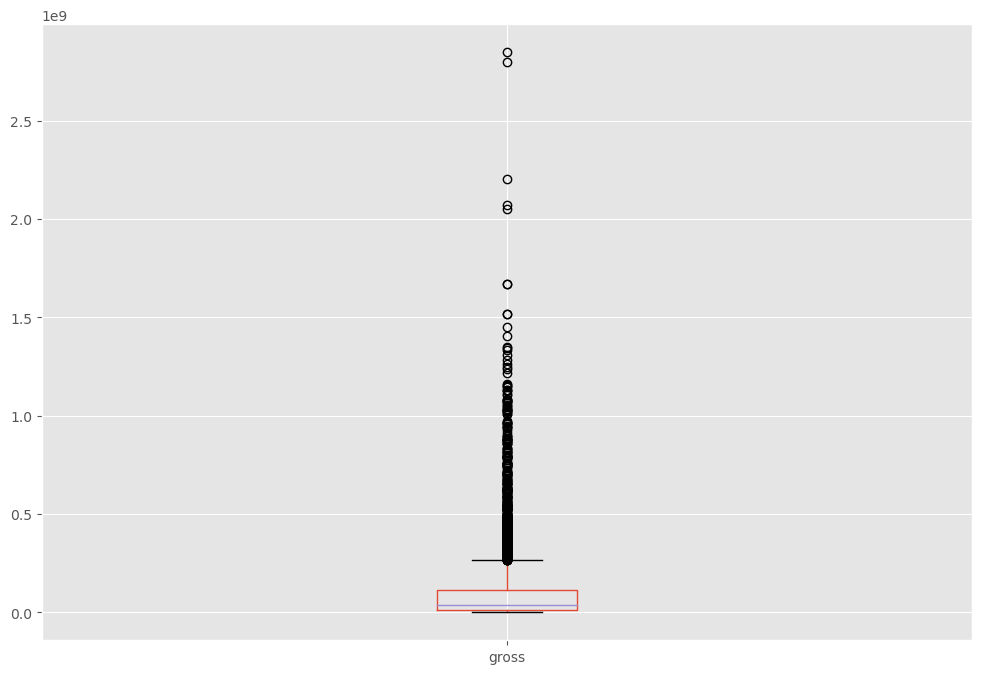

In [12]:
# Check outliers

df.boxplot(column=['gross'])

With the above plot, we can infer that if a film making above approximately 250 million will be considered doing exceptionally well.

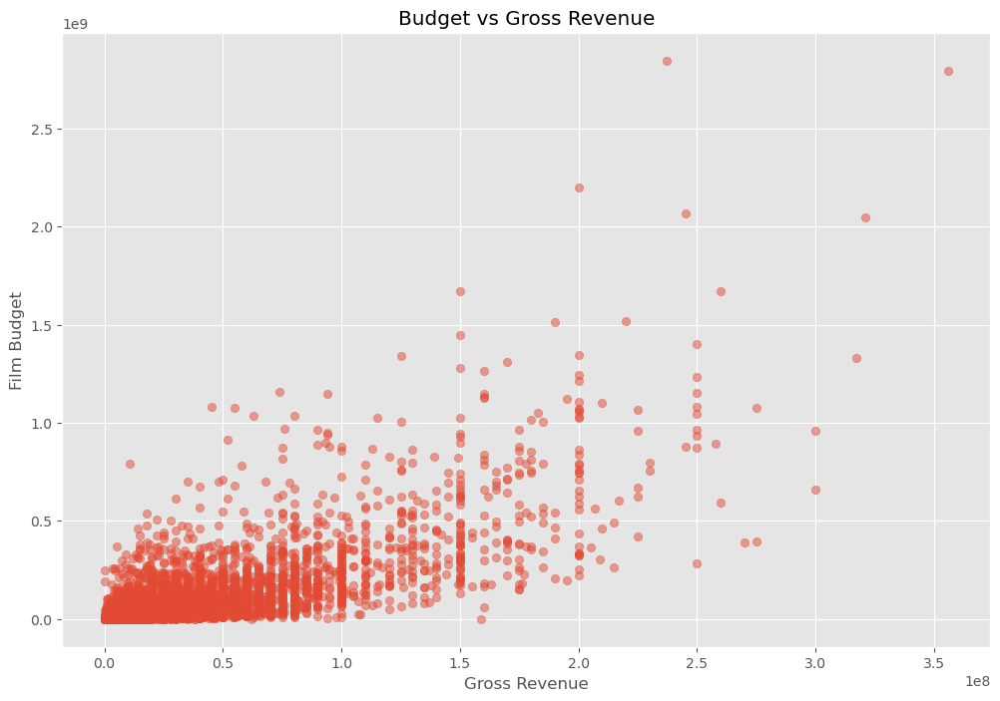

In [13]:
# Scatter Plot

plt.scatter(x=df['budget'], y=df['gross'], alpha=0.5)
plt.title('Budget vs Gross Revenue')
plt.xlabel('Gross Revenue')
plt.ylabel('Film Budget')

plt.show()

Text(0.5, 1.0, 'Film Budget VS Gross Revenue')

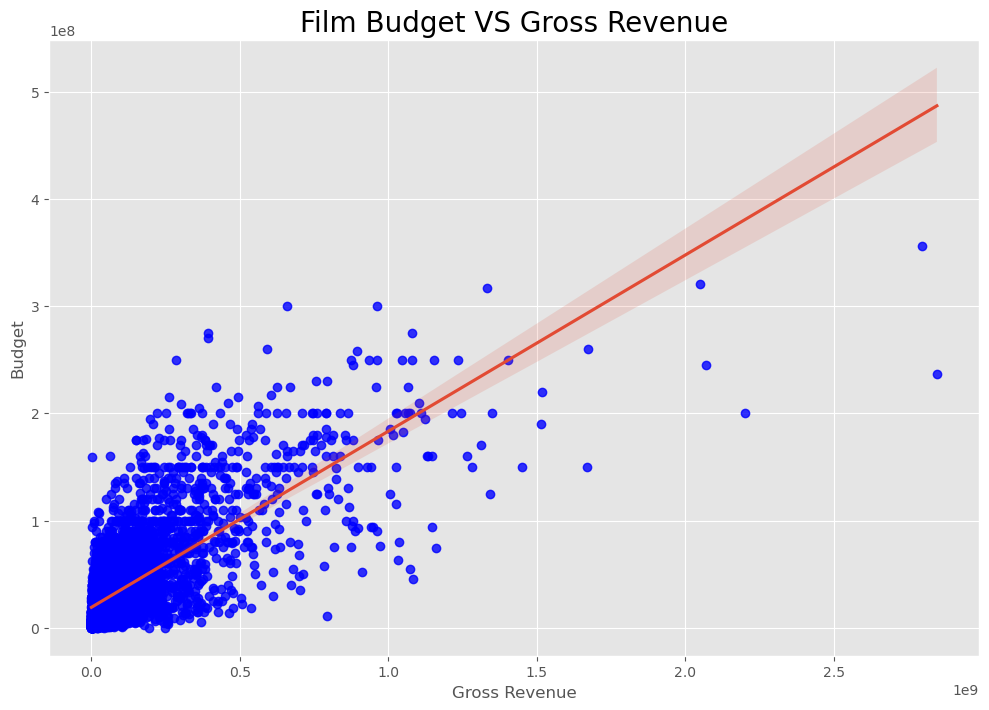

In [14]:
# Plot Gross Revenue against Budget

a = sns.regplot(x='gross', y='budget', data=df, scatter_kws={'color':'blue'})
a.set_xlabel('Gross Revenue', size=12)
a.set_ylabel('Budget', size=12)
a.set_title('Film Budget VS Gross Revenue' , size=20)

From the above graph, we can tell that there is a strong positive correlation between Gross Revenue and Film Budget

Text(0.5, 1.0, 'Film Score VS Gross Revenue')

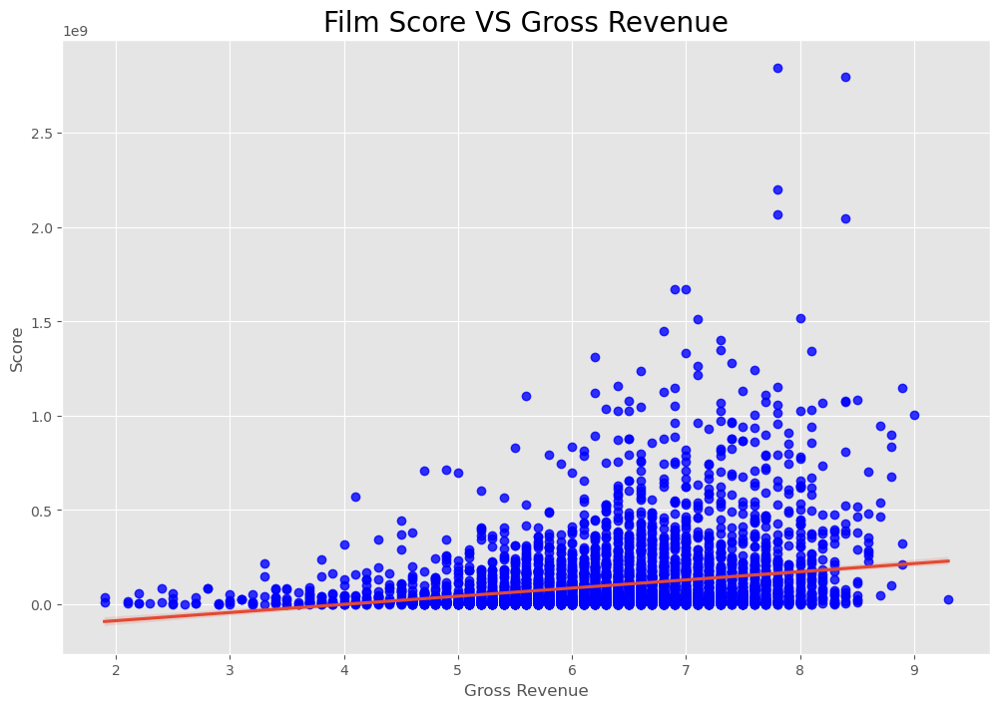

In [15]:
# Plot Score against Gross Revenue

b = sns.regplot(x="score", y="gross", data=df, scatter_kws={'color':'blue'})
b.set_xlabel('Gross Revenue', size=12)
b.set_ylabel('Score', size=12)
b.set_title('Film Score VS Gross Revenue' , size=20)

From the above graph, we can infer a weak positive correlation between Gross Revenue and Film Score

<AxesSubplot:xlabel='rating', ylabel='gross'>

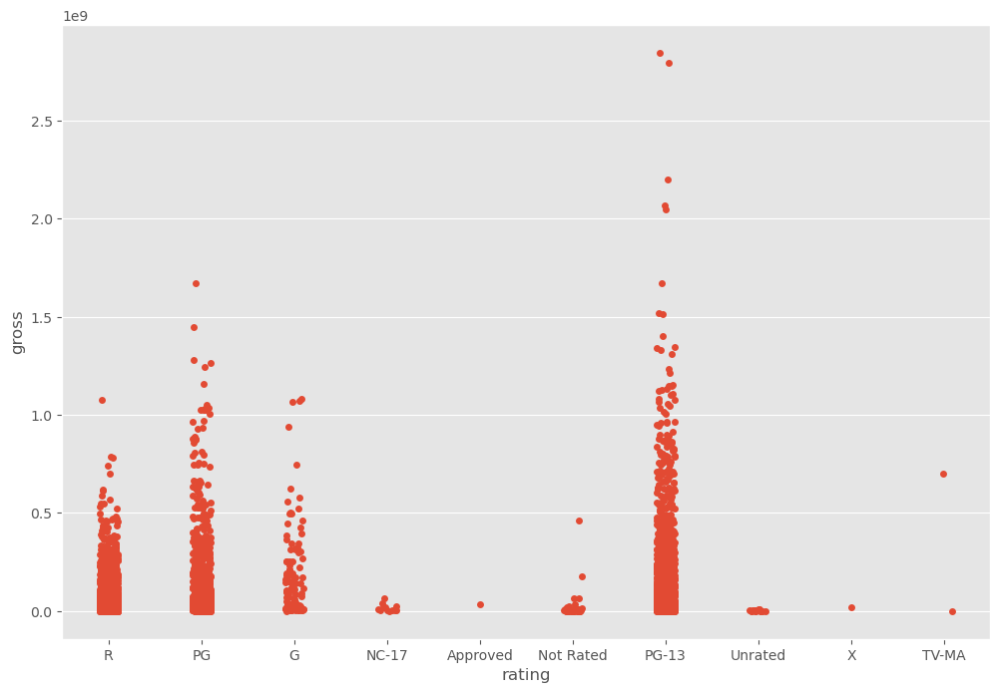

In [16]:
# Strip Plot Rating VS Gross Revenue 

sns.stripplot(x="rating", y="gross", data=df)

In [17]:
# Correlation Matrix

df.corr()

,score,votes,budget,gross,runtime,year,year_released
score,1.000000,0.474256,0.072001,0.222556,0.414068,0.056386,0.061923
votes,0.474256,1.000000,0.439675,0.614751,0.352303,0.206021,0.203098
budget,0.072001,0.439675,1.000000,0.740247,0.318695,0.327722,0.320312
gross,0.222556,0.614751,0.740247,1.000000,0.275796,0.274321,0.268721
runtime,0.414068,0.352303,0.318695,0.275796,1.000000,0.075077,0.075294
year,0.056386,0.206021,0.327722,0.274321,0.075077,1.000000,0.998726
year_released,0.061923,0.203098,0.320312,0.268721,0.075294,0.998726,1.000000


In [18]:
df.corr(method='kendall')

,score,votes,budget,gross,runtime,year,year_released
score,1.000000,0.350185,-0.006406,0.124943,0.292254,0.039389,0.043400
votes,0.350185,1.000000,0.346274,0.553625,0.205344,0.296512,0.293044
budget,-0.006406,0.346274,1.000000,0.512057,0.231278,0.220833,0.213719
gross,0.124943,0.553625,0.512057,1.000000,0.176979,0.239539,0.232372
runtime,0.292254,0.205344,0.231278,0.176979,1.000000,0.064824,0.064793
year,0.039389,0.296512,0.220833,0.239539,0.064824,1.000000,0.991304
year_released,0.043400,0.293044,0.213719,0.232372,0.064793,0.991304,1.000000


In [19]:
df.corr(method='spearman')

,score,votes,budget,gross,runtime,year,year_released
score,1.000000,0.495409,-0.009971,0.183192,0.412155,0.057741,0.063674
votes,0.495409,1.000000,0.493461,0.745793,0.300621,0.427623,0.422988
budget,-0.009971,0.493461,1.000000,0.692958,0.330794,0.312886,0.302535
gross,0.183192,0.745793,0.692958,1.000000,0.257400,0.351045,0.340529
runtime,0.412155,0.300621,0.330794,0.257400,1.000000,0.095444,0.095507
year,0.057741,0.427623,0.312886,0.351045,0.095444,1.000000,0.998694
year_released,0.063674,0.422988,0.302535,0.340529,0.095507,0.998694,1.000000


A quick trial with the 3 different correlation models. For this project, we will stick with the Pearson's model (which is also the default model)

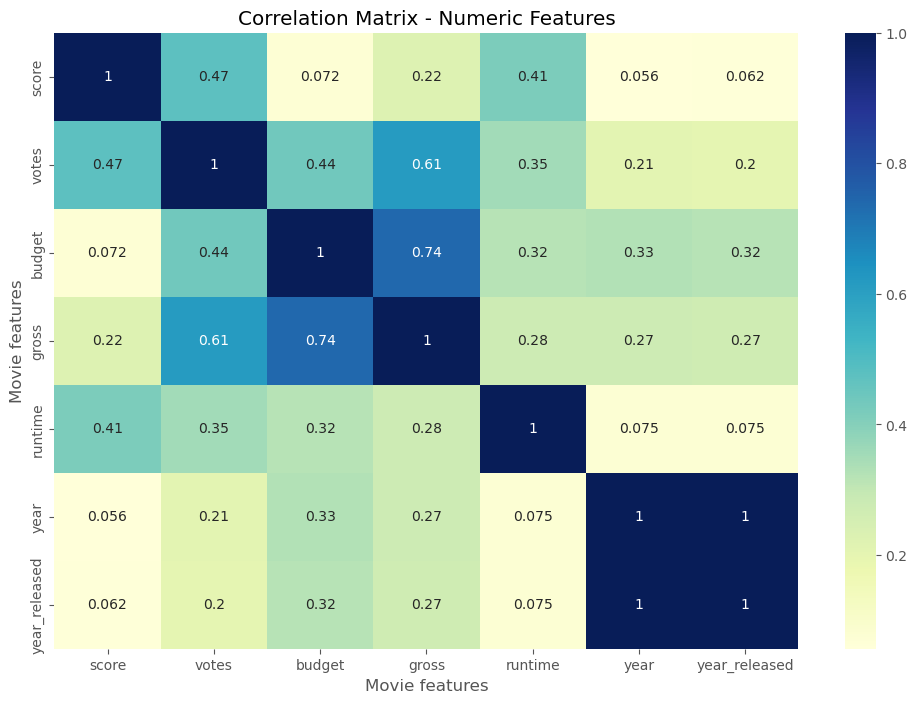

In [20]:
# Plot heatmap

sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
plt.title("Correlation Matrix - Numeric Features")
plt.xlabel("Movie features")
plt.ylabel("Movie features")

plt.show()

In [21]:
# Give category codes to non-numeric features to compare

df_num = df

for col in df_num.columns:
    if(df_num[col].dtype == 'object'):
        df_num[col] = df_num[col].astype('category')
        df_num[col] = df_num[col].cat.codes
        
df_num

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
0,4692,1795,2832,699,46,1426,6,6,8.4,927000,19000000,46998772,146,1304,1980,1980
1,3929,1578,1158,214,47,452,6,1,5.8,65000,4500000,58853106,104,1127,1980,1980
2,3641,757,1818,1157,47,945,4,0,8.7,1200000,18000000,538375067,124,1359,1980,1980
3,204,889,1413,1474,47,1108,4,4,7.7,221000,3500000,83453539,88,1127,1980,1980
4,732,719,351,271,47,1083,6,4,7.3,108000,6000000,39846344,98,1170,1980,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,415,16,2390,1812,47,452,6,0,6.6,140000,90000000,426505244,124,904,2020,2020
7649,3556,852,2309,147,47,1108,4,0,6.5,102000,85000000,319715683,99,713,2020,2020
7650,1153,1809,2827,1470,47,1397,4,1,5.6,53000,175000000,245487753,101,904,2020,2020
7651,3978,294,2091,640,6,12,4,1,6.8,42000,135000000,111105497,100,758,2020,2020


In [22]:
# Correlation Matrix with non-numeric features

df_num.corr()

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
name,1.000000,0.015246,0.012880,-0.006882,-0.025490,0.021697,-0.029234,0.010996,0.014450,0.012615,0.023392,0.005639,0.010850,-0.006152,0.025542,0.025542
director,0.015246,1.000000,0.261735,0.036593,0.011133,-0.008223,0.014656,-0.008553,0.005413,-0.010376,-0.009662,-0.029560,0.017433,0.002308,-0.038354,-0.037371
writer,0.012880,0.261735,1.000000,0.018520,0.022488,-0.003697,-0.003149,0.017578,0.012843,-0.005316,-0.039466,-0.035885,-0.017561,0.008072,-0.025908,-0.025495
star,-0.006882,0.036593,0.018520,1.000000,-0.009990,0.014082,0.009196,0.003341,0.007296,-0.017638,-0.021473,-0.000004,0.010108,0.015706,-0.032157,-0.032687
country,-0.025490,0.011133,0.022488,-0.009990,1.000000,0.048569,0.008230,-0.009164,-0.043051,0.041551,0.052977,0.060078,-0.034477,-0.017228,-0.066748,-0.073569
company,0.021697,-0.008223,-0.003697,0.014082,0.048569,1.000000,-0.092357,-0.071334,0.020656,0.118470,0.170235,0.149553,0.037585,-0.002407,-0.014333,-0.018806
rating,-0.029234,0.014656,-0.003149,0.009196,0.008230,-0.092357,1.000000,0.147796,0.065983,0.006031,-0.203946,-0.181906,0.140792,0.018083,0.019499,0.022021
genre,0.010996,-0.008553,0.017578,0.003341,-0.009164,-0.071334,0.147796,1.000000,0.035106,-0.135990,-0.368523,-0.244101,-0.059237,0.022142,-0.073167,-0.069147
score,0.014450,0.005413,0.012843,0.007296,-0.043051,0.020656,0.065983,0.035106,1.000000,0.474256,0.072001,0.222556,0.414068,0.045874,0.056386,0.061923
votes,0.012615,-0.010376,-0.005316,-0.017638,0.041551,0.118470,0.006031,-0.135990,0.474256,1.000000,0.439675,0.614751,0.352303,0.028833,0.206021,0.203098


In [23]:
# Using factorize - this assigns a random numeric value for each unique categorical value

matrix = df_num.apply(lambda x: x.factorize()[0]).corr()

matrix

,name,director,writer,star,country,company,rating,genre,score,votes,budget,gross,runtime,released,year,year_released
name,1.000000,0.725411,0.791872,0.695124,0.098110,0.535369,0.169808,0.028413,-0.020083,0.297305,0.288955,0.967925,0.048980,0.966086,0.965461,0.921688
director,0.725411,1.000000,0.717990,0.636705,0.095349,0.483737,0.096014,0.036671,-0.006583,0.187909,0.124051,0.751737,-0.026918,0.750825,0.747785,0.708189
writer,0.791872,0.717990,1.000000,0.626647,0.098623,0.477503,0.128909,0.033975,-0.021538,0.225105,0.208088,0.811356,0.023123,0.809858,0.812386,0.779672
star,0.695124,0.636705,0.626647,1.000000,0.098071,0.442307,0.115694,0.045497,0.015108,0.182043,0.138015,0.720811,0.033297,0.720076,0.719373,0.684736
country,0.098110,0.095349,0.098623,0.098071,1.000000,0.153912,-0.004547,-0.003314,0.016567,-0.021562,0.016348,0.094820,0.040813,0.096807,0.095073,0.088955
company,0.535369,0.483737,0.477503,0.442307,0.153912,1.000000,-0.026286,0.015127,-0.008555,0.007423,-0.053573,0.545924,-0.010695,0.546033,0.537731,0.506753
rating,0.169808,0.096014,0.128909,0.115694,-0.004547,-0.026286,1.000000,-0.116507,0.036114,0.097619,0.203698,0.172703,0.032265,0.171063,0.179456,0.169681
genre,0.028413,0.036671,0.033975,0.045497,-0.003314,0.015127,-0.116507,1.000000,-0.027402,-0.009983,0.020893,0.032033,0.000056,0.031251,0.031765,0.031669
score,-0.020083,-0.006583,-0.021538,0.015108,0.016567,-0.008555,0.036114,-0.027402,1.000000,-0.041981,-0.005493,-0.015744,0.011831,-0.019486,-0.014594,-0.012946
votes,0.297305,0.187909,0.225105,0.182043,-0.021562,0.007423,0.097619,-0.009983,-0.041981,1.000000,0.359065,0.307248,0.126362,0.313254,0.323916,0.316065


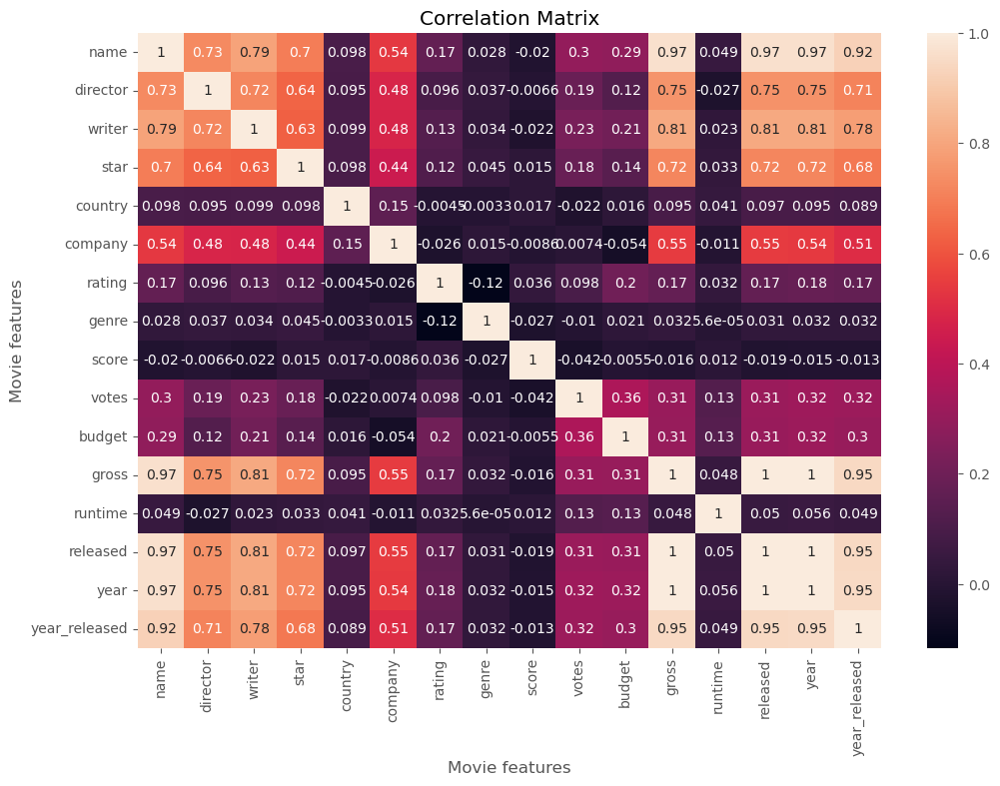

In [24]:
# Plot heatmap with factorized dataframe

sns.heatmap(df_num.apply(lambda x: x.factorize()[0]).corr(), annot=True)
plt.title("Correlation Matrix")
plt.xlabel("Movie features")
plt.ylabel("Movie features")

plt.show()

In [25]:
corr_pairs = matrix.unstack()

corr_pairs

name           name             1.000000
               director         0.725411
               writer           0.791872
               star             0.695124
               country          0.098110
                                  ...   
year_released  gross            0.945958
               runtime          0.049194
               released         0.945065
               year             0.950610
               year_released    1.000000
Length: 256, dtype: float64

In [26]:
sorted_pairs = corr_pairs.sort_values(kind="quicksort")

sorted_pairs

genre          rating          -0.116507
rating         genre           -0.116507
company        budget          -0.053573
budget         company         -0.053573
score          votes           -0.041981
                                  ...   
star           star             1.000000
writer         writer           1.000000
director       director         1.000000
year           year             1.000000
year_released  year_released    1.000000
Length: 256, dtype: float64

In [27]:
# Look at pairs with strong correlations

strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5]

strong_pairs

year_released  company          0.506753
company        year_released    0.506753
               name             0.535369
name           company          0.535369
company        year             0.537731
                                  ...   
star           star             1.000000
writer         writer           1.000000
director       director         1.000000
year           year             1.000000
year_released  year_released    1.000000
Length: 82, dtype: float64

In [28]:
# Top 15 companies by Gross Revenue

GrossSum = df.groupby('company')[["gross"]].sum()
GrossSumSorted = GrossSum.sort_values('gross', ascending=False)[:15]
GrossSumSorted = GrossSumSorted['gross'].astype('int64') 

GrossSumSorted

company
1426    54610959970
1397    51241105418
452     42356430218
1108    40021704691
1382    39542573303
1423    35833650748
1044    19612851164
983     15065592411
550     11873612858
551     11593807697
1367    10664679494
1001     8937010092
1309     8318570396
1134     7886344526
682      7243673721
Name: gross, dtype: int64

In [29]:
# Annual Top 15 companies by Gross Revenue

GrossSumYear = df.groupby(['company', 'year'])[["gross"]].sum()
GrossSumYearSorted = GrossSumYear.sort_values(['gross','company','year'], ascending = False)[:15]
GrossSumYearSorted = GrossSumYearSorted['gross'].astype('int64') 

GrossSumYearSorted

company  year
1423     2019    5773131804
983      2018    4018631866
1397     2015    3834354888
1382     2009    3793491246
1423     2017    3789382071
1108     2011    3565705182
1426     2011    3223799224
1423     2010    3104474158
1108     2014    3071298586
452      2006    2934631933
         2019    2932757449
983      2019    2797501328
1426     2018    2774168962
452      2011    2738363306
1426     2005    2688767210
Name: gross, dtype: int64

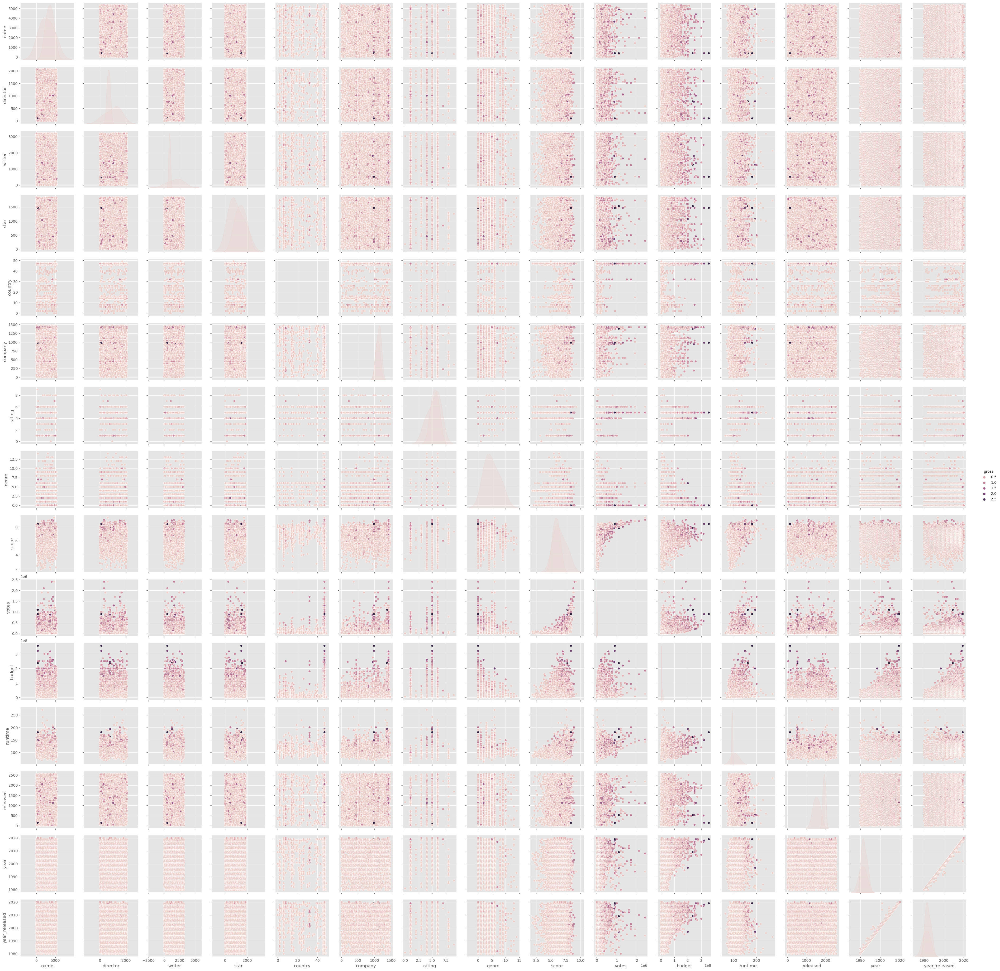

In [30]:
# Pair Plot

sns.pairplot(df, hue='gross')